# 散布度

In [59]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy import stats
df = sns.load_dataset('tips')
df['tip_rate'] = df['tip'] / df['total_bill']
from IPython.display import Image

# 画像ファイル名(パス)
file_name = "images/range.png"
file_name2 = "images/quartile.png"
file_name3 = "images/quartile2.png"
file_name4 = "images/md.png"
file_name5 = "images/variance.png"
file_name6 = "images/st_dv.png"
file_name7 = "images/std_var.png"

## <u>範囲</u>

<center>
  <br>
        <h3><font color="red"><b>dataの範囲, 最小値 〜 最大値</b></font></h3>
  <br>
  <br>
</center>

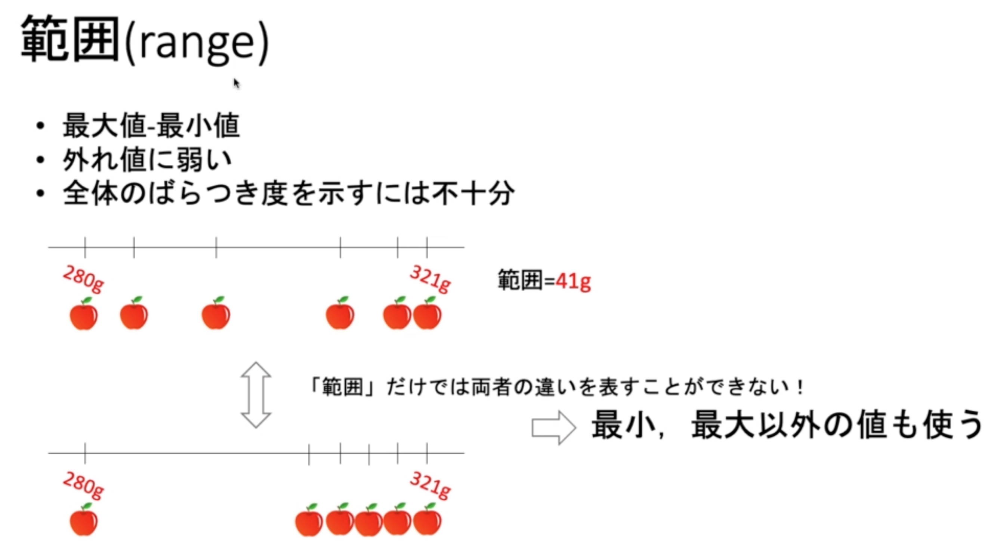

In [8]:
# IPythonで画像の読み込みと表示
Image(file_name, embed=True, width=600, height=400)

### 範囲　（range）
- 最小値を求める
- 最大値を求める

In [10]:
np.min(df['tip'])

1.0

In [11]:
df['tip'].min()

1.0

In [12]:
df.groupby('sex').min()

,total_bill,tip,size,tip_rate
sex,,,,
Male,7.25,1.0,1,0.035638
Female,3.07,1.0,1,0.056433


In [13]:
np.max(df['tip'])

10.0

In [14]:
df['tip'].max()

10.0

In [15]:
df.groupby('sex').max()

,total_bill,tip,size,tip_rate
sex,,,,
Male,50.81,10.0,6,0.710345
Female,44.30,6.5,6,0.416667


In [16]:
# 範囲を求める
df['tip'].max() - df['tip'].min()

9.0

## <u>四分位数</u> (quartile)

<center>
  <br>
        <h3><font color="red"><b>data の sort して四分割した時の値</b></font></h3>
  <br>
  <br>
</center>

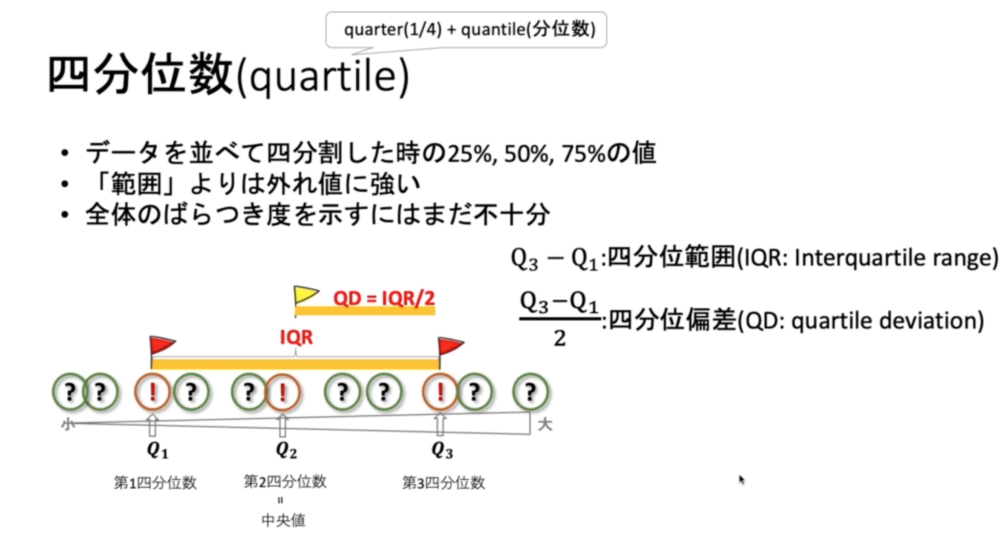

In [20]:
# IPythonで画像の読み込みと表示
Image(file_name2, embed=True, width=700, height=600)

### 四分位数　(quartile)
- 四分位数を求める
- 四分位範囲　(IQR)　を求める

In [23]:
# 四分位数を求める : 指定した分位数を求める事ができる
np.quantile(df['tip_rate'], [0.25, 0.5, 0.75])

array([0.12912736, 0.15476977, 0.19147549])

In [22]:
df.head()

,total_bill,tip,sex,smoker,day,time,size,tip_rate
0,16.99,1.01,Female,No,Sun,Dinner,2,0.059447
1,10.34,1.66,Male,No,Sun,Dinner,3,0.160542
2,21.01,3.50,Male,No,Sun,Dinner,3,0.166587
3,23.68,3.31,Male,No,Sun,Dinner,2,0.139780
4,24.59,3.61,Female,No,Sun,Dinner,4,0.146808


In [25]:
# Series で四分位数
df['tip_rate'].quantile([0.25, 0.5, 0.75])

0.25    0.129127
0.50    0.154770
0.75    0.191475
Name: tip_rate, dtype: float64

In [26]:
# 四分位範囲　（IQR） : Q3 - Q1
stats.iqr(df['tip_rate'])

0.06234812458689151

In [27]:
# 0.75(75%) - 0.25(25%)
0.191475 - 0.129127

0.062348000000000015

In [29]:
# 四分位偏差（QD） : Q3 - Q1 / 2
iqr = stats.iqr(df['tip_rate'])
qd = iqr / 2
qd

0.031174062293445756

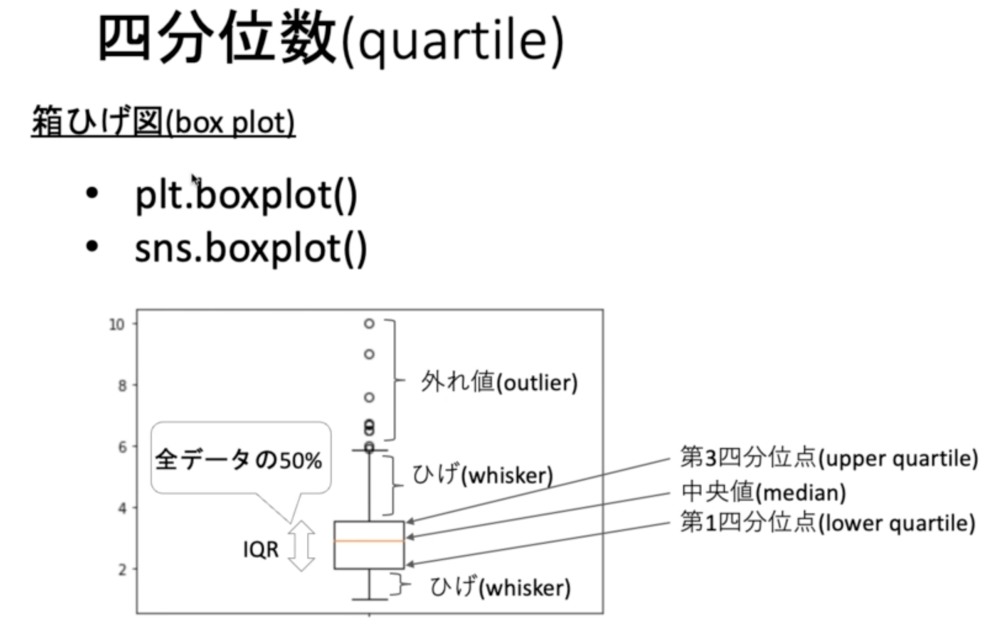

In [33]:
# IPythonで画像の読み込みと表示
Image(file_name3, embed=True, width=600, height=500)

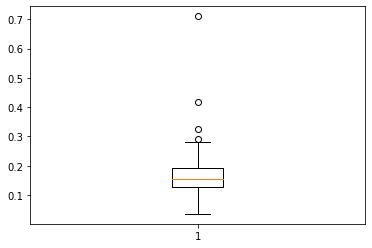

In [38]:
# 四分位範囲　（IQR） : Q3 - Q1 -> 箱ひげ図　 matplotlib
plt.boxplot(df['tip_rate'])
plt.show()

<AxesSubplot:xlabel='size', ylabel='tip_rate'>

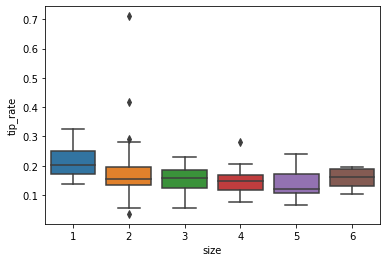

In [40]:
# 四分位範囲　（IQR） : Q3 - Q1 -> 箱ひげ図　 seaborn
sns.boxplot(x='size', y='tip_rate', data=df)

<AxesSubplot:xlabel='sex', ylabel='tip_rate'>

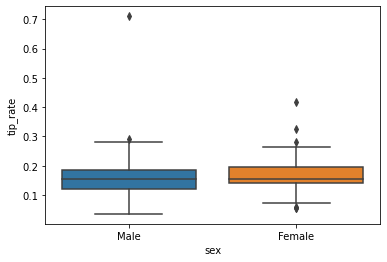

In [41]:
# 四分位範囲　（IQR） : Q3 - Q1 -> 箱ひげ図　 seaborn
sns.boxplot(x='sex', y='tip_rate', data=df)

## <u>平均偏差</u>　(MD : dean deviation)

<center>
  <br>
        <h3><font color="red"><b>平均値（またわ中央値）からの偏差の平均</b></font></h3>
  <br>
  <br>
</center>

$$
\begin{aligned}
MD　=　& \frac{1}{n}(|x_1-\bar{x}|+|x_2-\bar{x}|+...+|x_n-\bar{x}|) \\
\\
　=　& \frac{1}{n}\sum_{i=1}^{n} |x_i-\bar{x}|  \\
\end{aligned}
$$

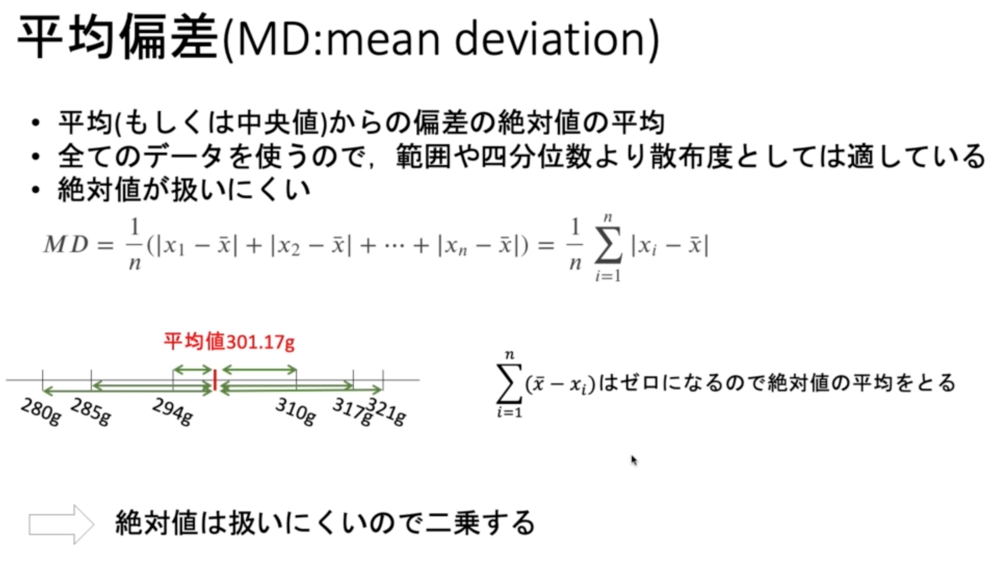

In [46]:
# IPythonで画像の読み込みと表示
Image(file_name4, embed=True, width=700, height=600)

# <u>分散</u>　(variance)

<center>
  <br>
        <h3><font color="red"><b>偏差の二乗の平均</b></font></h3>
    <h3><font color="red"><b>特に重要！！</b></font></h3>
  <br>
</center>

$$
\begin{aligned}
S^2　=　& \frac{1}{n}((x_1-\bar{x})^2+(x_2-\bar{x})^2+...+(x_n-\bar{x})^2) \\
\\
　=　& \frac{1}{n}\sum_{i=1}^{n} (x_i-\bar{x})^2 \\
\end{aligned}
$$

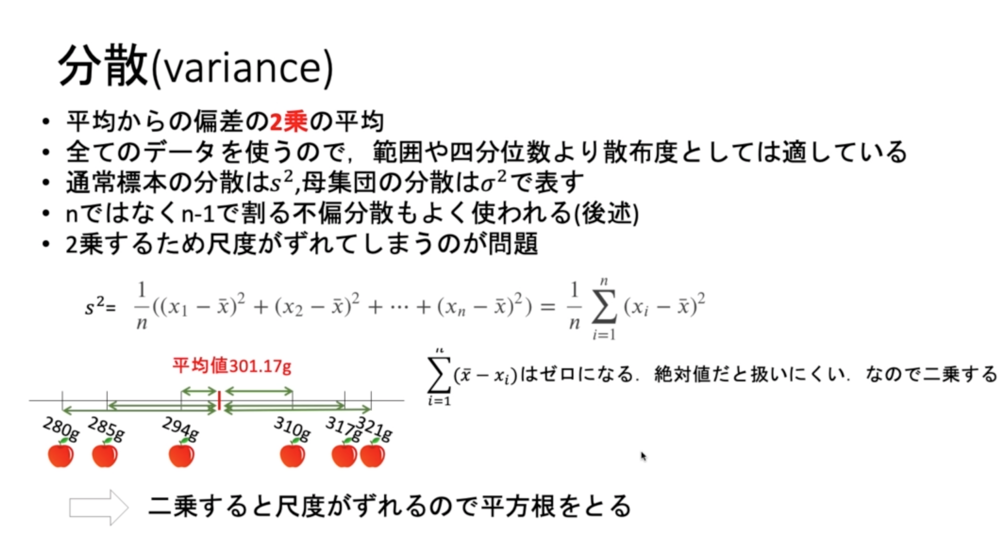

In [50]:
# IPythonで画像の読み込みと表示
Image(file_name5, embed=True, width=800, height=700)

# <u>標準偏差</u>　(standard deviation)

<center>
  <br>
        <h3><font color="red"><b>分散の平方根</b></font></h3>
        <h3><font color="red"><b>特に重要！！</b></font></h3>
  <br>
</center>

$$
S　=　\sqrt{\frac{1}{n}\sum_{i=1}^{n} (x_i - \bar{x})^2}
$$

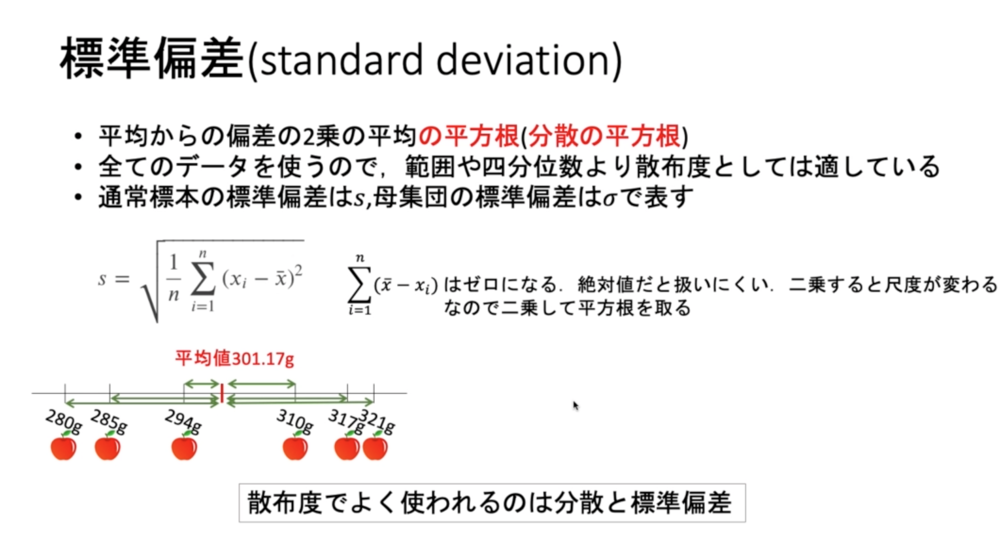

In [52]:
# IPythonで画像の読み込みと表示
Image(file_name6, embed=True, width=800, height=700)

## 分散と標準偏差を求める
- 分散を求める

```python
np.var(　)
```

- 標準偏差を求める

```python
np.std( )
```

In [53]:
# 分散
np.var(df['tip_rate'])

0.0037145280013546928

In [54]:
# 分散
np.var(df['tip'])

1.9066085124966428

In [55]:
# 標準偏差
np.std(df['tip_rate'])

0.060946927743362855

In [56]:
# 標準偏差
np.std(df['tip'])

1.3807999538298958

In [58]:
np.sqrt(np.var(df['tip']))

1.3807999538298958

In [61]:
tip_mean = df['tip'].mean()
tip_mean

2.9982786885245902

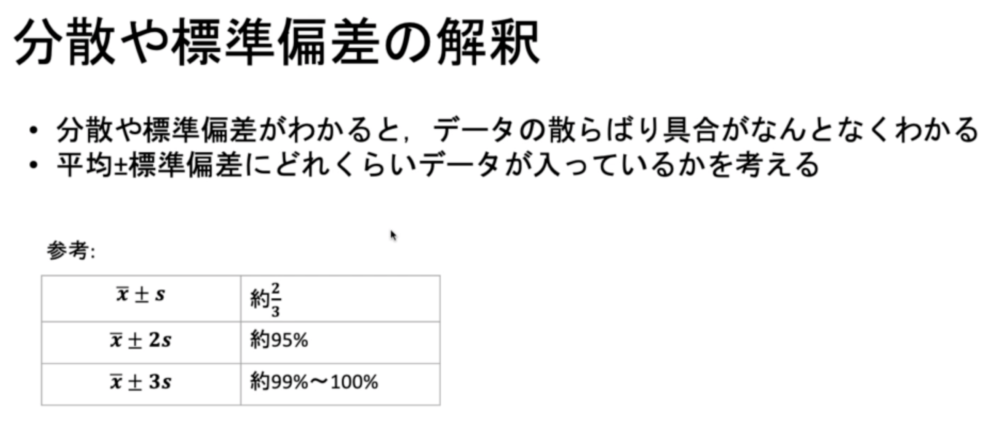

In [60]:
# IPythonで画像の読み込みと表示
Image(file_name7, embed=True, width=800, height=700)